<a href="https://colab.research.google.com/github/constanzaamunoz/ML-2025-01/blob/avance-2.1/Tarea_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

EAE3709 APLICACIONES DE  MACHINE LEARNING EN ECONOMÍA <br>
1ER SEMESTRE 2025 <br>
INSTITUTO DE ECONOMÍA <br>
PONTIFICIA UNIVERSIDAD CATÓLICA DE CHILE


# **TAREA 2**


---


Profesor:
- Joaquín Pérez Lapillo

Ayudantes:

- Luis García B.
- Sebastián Hernández B.
- Oscar Herrera G.


**Complete sus datos:**

- Nombre y apellido:
  - `Constanza Muñoz`
- Usuario de GitHub (opcional):  `constanzaamunoz,link:`  https://github.com/constanzaamunoz/ML-2025-01


## Instrucciones

- Descargue el notebook y cárguelo en su Drive.
- Todas las preguntas deben ser contestadas en su notebook.
- Para que una pregunta esté correcta el código debe correr.
- Si es necesario, realice comentarios breves en su código explicando lo que está realizando o sus resultados.
- Una vez culminada su tarea, suba su notebook al buzón de tareas de Canvas.
- La fecha y hora límite de esta tarea es el _**domingo 01 de junio a las 20:00 hrs**_.



### Distribución de puntaje


| Pregunta                        | Puntaje |
|--------------------------------|---------|
| Pregunta 1.0                   |    1    |
| Pregunta 1.1                   |    2    |
| Pregunta 1.2                   |    2    |
| Pregunta 1.3                   |    2    |
| Pregunta 1.4                   |    5    |
| Pregunta 1.5                   |    5    |
| Pregunta 1.6                   |    2    |
| Pregunta 1.7                   |    2    |
| Pregunta 1.8                   |    3    |
| Pregunta 1.9                   |    3    |
| Pregunta 1.10                   |    5    |
| Pregunta 1.11                   |    5    |
| Pregunta 1.12                   |    5    |
| Pregunta 1.13                   |    3    |
| Pregunta 1.13                   |    5    |
| Pregunta 2.0                   |    1    |
| Pregunta 2.1                   |    1    |
| Pregunta 2.2                   |    1    |
| Pregunta 2.3                   |    3    |
| Pregunta 2.4                   |    5    |
| Pregunta 2.5                   |    3    |
| Pregunta 2.6                   |    3    |
| Pregunta 2.7                   |    3    |
| Pregunta 2.8                   |    5    |
| Pregunta 2.9                   |    7    |
| Pregunta 2.10                   |    4    |
| Pregunta 2.11                   |    3    |
| Pregunta 2.12                   |    1    |
| Pregunta 2.13                   |    2    |
| Pregunta 2.14                   |    3    |
| Pregunta 2.15                   |    2    |
| Pregunta 2.16                   |    3    |

Total: 100 pts.


# 1. Clasificación

En esta pregunta trabajaremos con un _dataset_ que contiene información campañas de marketing de un banco portugués. La campaña se enfocó en llamadas telefónicas a distintos segmentos de clientes, de forma individualizada, con el objetivo incenitvar la toma depósitos por parte de los clientes.

El problema presentado en este ejecicio busca predecir si el cliente suscribirá (sí/no) un depósito a plazo.



A continuación, se despliega información oficial sobre el _dataset_:

| Variable Name | Role    | Type        | Description                                                                                                                               |
|---------------|---------|-------------|-------------------------------------------------------------------------------------------------------------------------------------------|
| age           | Feature | Integer     |     years of age                                                                                                                                      |
| job           | Feature | Categorical | type of job |
| marital       | Feature | Categorical | marital status                          |
| education     | Feature | Categorical | Education level         |
| default       | Feature | Binary      | has credit in default?                                                                                                                    |
| balance       | Feature | Integer     | average yearly balance in euros                                                                                                                    |
| housing       | Feature | Binary      | has housing loan?                                                                                                                         |
| loan          | Feature | Binary      | has personal loan?                                                                                                                        |
| contact       | Feature | Categorical | contact communication type                                                                         |
| day_of_week   | Feature | Date        | last contact day of the month (numeric)                                                                                                              |
| month         | Feature | Date        | last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')                                                          |
| duration*      | Feature | Integer     | last contact duration, in seconds (numeric).  |
| campaign      | Feature | Integer     | number of contacts performed during this campaign and for this client                                      |
| pdays         | Feature | Integer     | number of days that passed by after the client was last contacted from a previous campaign (numeric; -1 means client was not previously contacted) |
| previous      | Feature | Integer     | number of contacts performed before this campaign and for this client                                                                       |
| poutcome      | Feature | Categorical | outcome of the previous marketing campaign                                                |
| y             | Target  | Binary      | has the client subscribed a term deposit?                                                                                                 |


*Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.



En el sitio web [https://archive.ics.uci.edu/dataset/222/bank+marketing](https://archive.ics.uci.edu/dataset/222/bank+marketing) podrá encontrar información oficial del _dataset_.

Use el código otorgado a continuación para importar los datos.


In [2]:
pip install ucimlrepo

In [3]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
bank_marketing = fetch_ucirepo(id=222)

# data (as pandas dataframes)
X = bank_marketing.data.features
y = bank_marketing.data.targets


## Exploratory Data Analysis (EDA)

### Pregunta 1.0

Concatene `X` e `y` en un dataframe consolidado.

Muestre las primeras cinco observaciones en el dataframe consolidado. Despliegue información sobre el tipo de variable de cada una de las columnas del dataframe y despliegue estadísticas descriptivas de las variables según su tipo.

In [4]:
#librerías
import pandas as pd
import numpy as np

#se concatena los dataframes X (features) e y (targets)
df=pd.concat([X,y],axis=1)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no


### Pregunta 1.1

Identifique las columnas que presentan _missing values_ e indique el número de _missing values_ que poseen.

Impute los valores nulos con el método que estime conveniente, justificando su decisión.

In [5]:
#identificamos cuántos missing values tenemos
#ver tarea 1, usar el mismo código que calcula según % para mayor accuracy
total_missings = df.isnull().sum().sort_values(ascending=False)
total_missings #observamos el ranking del total de missings por variable.
total_datos = df.isnull().count()
total_datos #observamos el total de datos por variable.
percent_missings = (total_missings/total_datos).sort_values(ascending=False)*100
percent_missings[percent_missings>0] #mostramos los missing values como un % del total de datos por variable.
     

poutcome     81.747805
contact      28.798301
education     4.107407
job           0.637013
dtype: float64

Las opciones más frecuentes de solucionar missing values son:
- Eliminar columnas #Cuando los datos faltantes son muchos. Este es el caso de *poutcome*.
- Eliminar filas (observaciones) #Cuando missings son pocos. Este es el caso de *education* y *job*.
- Imputar datos (por columna) #Cuando datos son relativamente pocos. Este es el método a utilizar para *contact*.

Viendo los porcentajes de las variables, creo que es pertinente eliminar la columna *poutcome*, debido a que la cantidad de missing values que contiene es mayor al 80%, no así la variable *contact* que aun tiene más del 50% de las variables con valores válidos. Ésta última se imputará. Para las variables *education* y *job*, que tienen más del 95% de los datos, sólo se eliminarán las filas (observaciones) con missing values.

In [6]:
df.drop(columns=['poutcome'], inplace=True) #eliminamos la columna poutcome
df.dropna(subset=['education'], inplace=True) #eliminamos las filas con missing values en education
df.dropna(subset=['job'], inplace=True) #eliminamos las filas con missing values en job
#imputamos la columna contact y rellenamos NaN con la moda
df["contact"] = df["contact"].fillna(df["contact"].mode()[0]) #imputamos

In [7]:
df.isnull().sum().sort_values(ascending=False)

age            0
job            0
marital        0
education      0
default        0
balance        0
housing        0
loan           0
contact        0
day_of_week    0
month          0
duration       0
campaign       0
pdays          0
previous       0
y              0
dtype: int64

### Pregunta 1.2


Genere histogramas de las variables categóricas desagregando por la variable objetivo de interés. Interprete las relaciones que observa.

Responda: ¿Cuáles creen que son las variables categóricas más relevantes a la hora de determinar si el individuo hará un depósito?

In [8]:
categoricas = df.dtypes[df.dtypes == 'object'].index.tolist() #obtenemos las variables categóricas
categoricas.remove('y') #eliminamos la variable target

In [9]:
import plotly.express as px 

#Diagramas para las variables categóricas
for cat in categoricas:
    fig = px.histogram(df, x=cat, color='y', title=f'Histograma de {cat} deglosado por Variable Objetivo (y)',
                     category_orders={cat: df[cat].value_counts().index.tolist(), 'y': ['yes', 'no']}, # Ordena por 'yes' primero
                     labels={cat: cat, 'y': 'Realiza Deposito'})
    fig.update_layout(bargap=0.2)
    fig.for_each_trace(lambda trace: trace.update(visible=True if trace.name == 'yes' else 'legendonly'))
    fig.show()





---


*Escriba* su respuesta en esta celda...


---

### Pregunta 1.3

Identifique _outliers_ entre las variables numéricas del dataset. Además, impute estas observaciones si usted lo considera necesario. Justifique su decisión.

In [10]:
numericas = df.dtypes[df.dtypes != 'object'].index.tolist() #obtenemos las variables numéricas}
numericas

['age', 'balance', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous']

In [11]:
df[numericas].describe() #descripción de las variables numéricas

,age,balance,day_of_week,duration,campaign,pdays,previous
count,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000,43193.000000
mean,40.764082,1354.027342,15.809414,258.323409,2.758178,40.404070,0.584863
std,10.512640,3042.103625,8.305970,258.162006,3.063987,100.420624,2.332672
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,71.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,442.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1412.000000,21.000000,318.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,58.000000,871.000000,275.000000


Se puede notar que hay algunos datos con outliers fuera de lo común, por lo que se filtrarán las variables dependiendo del IQR de los datos. En la lista siguiente se muestra el orden que aplicaran a los datos o si se conservarán estos:
- **age**: outlier no preocupante, pero mejorable por IQR
- **balance**: outlier muy buera de lo común
- **day_of_week**: no preocupante ya que son días
- **duration**: outlier fuera de lo común
- **campaign**: outlier fuera de lo común
- **pdays**: outlier muy fuera de lo común
- **previous**: outlier muy fuera de lo común

In [12]:
df2 = df.copy()

In [13]:
numericas.remove('day_of_week')

In [14]:
for num in numericas:
    fig = px.box(df, y=num, color='y', title=f'Boxplot de {num} deglosado por Variable Objetivo (y)',
                 category_orders={'y': ['yes', 'no']},  # Ordena por 'yes' primero
                 labels={num: num, 'y': 'Realiza Deposito'})   
    fig.update_layout(yaxis_title=num, xaxis_title='Realiza Deposito')
    fig.show()

In [15]:
numericas

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']

In [16]:
for col in numericas:
    multiplier = 1.5  # Factor para definir el rango de los outliers
    if col == 'balance':
        multiplier = 5
    elif col == 'duration':
        multiplier = 5
    elif col == 'campaign':
        multiplier = 20
    Q1 = df2[col].quantile(0.25)
    Q3 = df2[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    if col == 'pdays':
        lower_bound = -1
        upper_bound = 900
    elif col == 'previous':
        lower_bound = 0
        upper_bound = 30
    df2 = df2[(df2[col] >= lower_bound) & (df2[col] <= upper_bound)]  # Filtramos los outliers

In [17]:
df2[numericas].describe(include='all') #descripción del dataframe filtrado

,age,balance,duration,campaign,pdays,previous
count,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000,41266.000000
mean,40.324771,973.863568,245.999515,2.760311,40.261499,0.560219
std,9.877634,1481.554864,219.011282,3.020766,100.627223,1.787302
min,18.000000,-4057.000000,0.000000,1.000000,-1.000000,0.000000
25%,32.000000,61.000000,102.000000,1.000000,-1.000000,0.000000
50%,39.000000,409.000000,178.000000,2.000000,-1.000000,0.000000
75%,48.000000,1272.000000,312.000000,3.000000,-1.000000,0.000000
max,70.000000,8037.000000,1387.000000,43.000000,871.000000,30.000000


In [18]:
for num in numericas:
    fig = px.box(df2, y=num, color='y', title=f'Boxplot de {num} deglosado por Variable Objetivo (y)',
                 category_orders={'y': ['yes', 'no']},  # Ordena por 'yes' primero
                 labels={num: num, 'y': 'Realiza Deposito'})   
    fig.update_layout(yaxis_title=num, xaxis_title='Realiza Deposito')
    fig.show()




---


Se identificarón los outliers para las variables numericas, como aquellos datos extremos y fuera de lo común alterando el comportamiento de los datos, por lo que se filtró la data para tener una mejor distribución de los datos numéricos.
Cabe destacar que para ```pdays``` y para ```previous``` a pesar de que se identificaron datos fuera del gráfico de caja y bigotes, se consideró solo como outliers los datos que excedían por lejos los resultados comúnes, además de que lo normal es que estos datos se concentrarán en rangos cercanos a -1 y 0 por el poco contacto que se generá con el cliente.


---

## Feature Engineering

### Pregunta 1.4

 Cree un _pipeline_ de preprocesamiento con las siguientes transformaciones a las columnas correspondientes:

*   **Columnas Numéricas** : Aplique un `StandardScaler` para estandarizar estas variables.
*   **Columnas Categóricas No Binarias** : Aplique `OneHotEncoder` para crear variables dummy. Asegúrese de manejar posibles categorías desconocidas durante la transformación.
*   **Columnas a Eliminar** : Elimine columnas que dejan de ser relavantes luego de las trasformaciones.
*  **Columnas Dummies MultiNivel** : cree columnas dummies para las variables multi categoricas (tomando codificadas a 0s y 1s =, para su respctiva categoria)
*  **Columnas Label Encoding MultiNivel** : Dentro de las columnas multinivel hay 2 columnas que presentan un orden natural. e.g. en la columna 'month' tenemos que 'jan' < 'feb' < 'dec'. Aplique en la columna 'month' y otra columna que deberá determinar usted un label encoder que capture ese ordenamiento natural, luego normalice con un minmax scaler para que las columnas varien entre 0 y 1.


Una vez creado el pipeline, aplíquelo a su conjunto de features (`X`). Muestre la forma (_shape_) del dataset original y del dataset procesado para verificar los cambios. ¿Cuántas nuevas columnas hay?

Adicionalmente, elimine del análisis la variable `day_of_week`. Si considera necesario realizar transformaciones adicionales a las variables, realicelas en este punto.



In [19]:
numericas = df2.dtypes[df2.dtypes != 'object'].index.tolist()  # Actualizamos las variables numéricas tras eliminar outliers
numericas.remove('day_of_week')
categoricas = df2.dtypes[df2.dtypes == 'object'].index.tolist()  # Actualizamos las variables categóricas tras eliminar outliers
categoricas.remove('y')  # Eliminamos la variable target de las categóricas
print(numericas)
print(categoricas)

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous']
['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month']


In [20]:
binary = [col for col in categoricas if df2[col].nunique() == 2]
binary

['default', 'housing', 'loan', 'contact']

Tenemos estas 5 columnas, pero contact en la información es categorica, por lo que se eliminará de la lista

In [21]:
binary.remove('contact')  # Eliminamos 'contact' ya que no es binaria
binary

['default', 'housing', 'loan']

In [22]:
# Eliminamos las variables binarias de las categóricas
for bin_var in binary:
	if bin_var in categoricas:
		categoricas.remove(bin_var)

In [23]:
cols_drop = ['day_of_week']
cat_ordinal = ['month', 'education']

In [24]:
# Orden específico para columnas ordenadas
ordinal_mappings = [
    ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'],  # month
    ['primary', 'secondary','tertiary'] # education
]


In [25]:
for ord in cat_ordinal:
	if ord in categoricas:
		categoricas.remove(ord)

In [26]:
print(numericas, '\n', categoricas, '\n', binary, '\n', cols_drop, '\n', cat_ordinal)

['age', 'balance', 'duration', 'campaign', 'pdays', 'previous'] 
 ['job', 'marital', 'contact'] 
 ['default', 'housing', 'loan'] 
 ['day_of_week'] 
 ['month', 'education']


In [27]:
df2['education'].unique()  # Verificamos los valores únicos de la variable education

array(['tertiary', 'secondary', 'primary'], dtype=object)

In [28]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler
from sklearn.base import BaseEstimator, TransformerMixin

# 1. Numéricas
num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

# 2. Categóricas sin orden aparente (multi-nivel)
cat_pipeline = Pipeline([
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# 3. Binarias
binary_pipeline = Pipeline([
    ('onehot', OneHotEncoder(drop='if_binary', dtype=int, sparse_output=False))  # asegura 1 columna por binaria
])

# 4. Ordinales con orden natural
ordinal_pipeline = Pipeline([
    ('ordinal', OrdinalEncoder(categories=ordinal_mappings)),
    ('minmax', MinMaxScaler())
])

class ColumnDropper(BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_drop):
        self.columns_to_drop = columns_to_drop

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.drop(columns=self.columns_to_drop)


In [29]:
preprocessor = Pipeline([
    ('drop_cols', ColumnDropper(columns_to_drop=cols_drop)),
    ('transform', ColumnTransformer([
        ('num', num_pipeline, numericas),
        ('cat', cat_pipeline, categoricas),
        ('binary', binary_pipeline, binary),
        ('ordinal', ordinal_pipeline, cat_ordinal)
    ], remainder='drop'))  # descarta cualquier otra columna no mencionada
])

## Modelos

En esta sección aplicaremos los algoritmos de clasificación vistos en el curso. Específicamente, compararemos el rendimiento de los siguientes modelos:

*   _Decision Tree Classifier_
*   _Random Forest Classifier_
*   _XGBoost Classifier_
*   _Naïve Bayes_



### Pregunta 1.5

Divida el conjunto de datos en conjuntos de entrenamiento y de prueba. Analice la distribución de la variable objetivo en ambos conjuntos para determinar si el conjunto de datos está balanceado o no.

En caso de que el conjunto de datos no esté balanceado, asegúrese de que la división de _train_-_test_ respete el balance de las clases target para evitar que se genere un sesgo. Para esto, se recomienda leer la documentación oficial de la función `train_test_split()`: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html.

Use la semilla `random_state` = 123.


In [30]:
X = df2.drop(columns=['y'])  # Features
y = df2['y']  # Target

In [31]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=123,
    stratify=y
)

### Pregunta 1.6

Entrene un árbol clasificador sin definir profundad máxima del árbol. Llamaremos a este, "modelo no regularizado".

Asegúrese de que el modelo sea capaz de lidiar con potenciales desbalances. Para esto se recomienda leer la documentación oficial de la *clase* `DecisionTreeClassifier()` (parámetros de inicialización): https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html.


Despliege el $F_1\ Score$ del modelo sobre la base de entrenamiento. Luego, grafique una representación del árbol entrenado. ¿Qué puede decir sobre este modelo no regularizado?

In [36]:
from sklearn.tree import DecisionTreeClassifier

# Pipeline con arbol no regularizado
noreg_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', DecisionTreeClassifier(class_weight='balanced', random_state=123))
])

noreg_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('drop_cols',
                                  ColumnDropper(columns_to_drop=['day_of_week'])),
                                 ('transform',
                                  ColumnTransformer(transformers=[('num',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['age',
                                                                    'balance',
                                                                    'duration',
                                                                    'campaign',
                                                                    'pdays',
                                                                    'previous']),
                                                                  ('cat',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_outp...
                                                                                                  sparse_output=False))]),
                                                                   ['default',
                                                                    'housing',
                                                                    'loan']),
                                                                  ('ordinal',
                                                                   Pipeline(steps=[('ordinal',
                                                                                    OrdinalEncoder(categories=[['jan',
                                                                                                                'feb',
                                                                                                                'mar',
                                                                                                                'apr',
                                                                                                                'may',
                                                                                                                'jun',
                                                                                                                'jul',
                                                                                                                'aug',
                                                                                                                'sep',
                                                                                                                'oct',
                                                                                                                'nov',
                                                                                                                'dec'],
                                                                                                               ['primary',
                                                                                                                'secondary',
                                                                                                                'tertiary']])),
                                                                                   ('minmax',
                                                                                    MinMaxScaler())]),
                                                                   ['month',
                            

In [37]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score

# Predicción sobre el conjunto de entrenamiento
y_train_pred = noreg_pipeline.predict(X_train)

print(confusion_matrix(y_train, y_train_pred))
print(accuracy_score(y_train, y_train_pred))
print(f1_score(y_train, y_train_pred, pos_label='yes'))

[[29435     0]
 [    0  3577]]
1.0
1.0


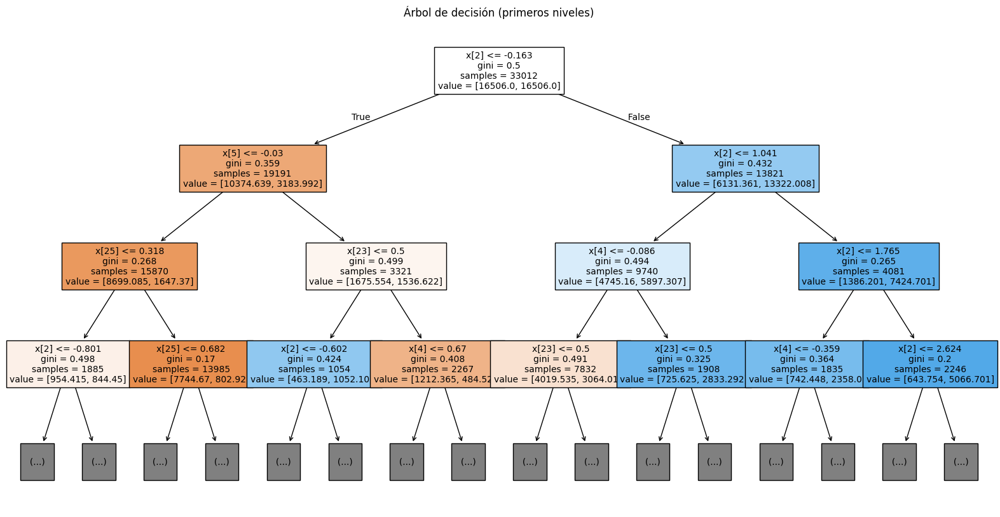

In [45]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

modelo_arbol = noreg_pipeline.named_steps['classifier']
plt.figure(figsize=(20, 10))
plot_tree(modelo_arbol, filled=True, max_depth=3, fontsize=10)
plt.title("Árbol de decisión (primeros niveles)")
plt.show()





---


Se puede notar que el arbol de decisión no regulado, tiene un f1_score de 100% para los datos de entrenamiento, esto nos dice que probablemente el modelo está overfitteando a la hora de predecir con estas variables, por lo que probablemente memorizó a la perfección estos datos, pero no implica que vaya a predecir bien con datos nuevos


---


### Pegunta 1.7

En el contexto particular de una campaña de marketing, donde probablemente la mayoría de clientes no harán depósitos, es importante identificar correctamente tanto los clientes que harán depósitos (clase minoritaria), como los clientes que no harán depósitos.

En el primer caso, falsos negativos implican un cliente peridido. En el segundo caso, falsos positivos implicarían un gasto de marketing innecesario en clientes que no son de interés. En este sentido, si clasificamos a todos los clientes como individuos que no harán depósitos, el _accuracy_ será muy alto, pero el costo económico será muy grande.

Para penalizar tanto falsos positivos, como falsos negativos, a la vez que se busca maximizar los verdaderos positivos, nos enfocaremos en la métrica de _performance_ $F_1\ Score$.

Calcule el $F_1\ Score$ de su árbol no regularizado con la muestra correcta. ¿Considera que es un buen valor? Comente.

In [39]:
# Predicción sobre el conjunto de correcto
y_pred = noreg_pipeline.predict(X_test)

print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(f1_score(y_test, y_pred, pos_label='yes'))

[[6830  530]
 [ 548  346]]
0.869396656166707
0.39096045197740115





---


En este caso, usando las variables de testeo para probar la predicción, se puede observar que el f1_score es de un 39% solamente, por lo que indica que para los datos nuevos el modelo predice bastante mal.


---


### Pregunta 1.8

Entrene un árbol clasificador con profundad máxima del árbol igual a 16. Llamaremos a este, "modelo levemente regularizado". Asegúrese de que el modelo sea capaz de lidiar con potenciales desbalances. Luego, despliege el $F_1\ Score$ del modelo sobre la base de entrenamiento.

Grafique una representación del árbol entrenado. ¿Qué puede decir sobre este modelo no regularizado?

In [41]:
modelo_leve = DecisionTreeClassifier(
    max_depth=16,
    class_weight='balanced',
    random_state=123
)

leve_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', modelo_leve)
])

leve_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('drop_cols',
                                  ColumnDropper(columns_to_drop=['day_of_week'])),
                                 ('transform',
                                  ColumnTransformer(transformers=[('num',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['age',
                                                                    'balance',
                                                                    'duration',
                                                                    'campaign',
                                                                    'pdays',
                                                                    'previous']),
                                                                  ('cat',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_outp...
                                                                   ['default',
                                                                    'housing',
                                                                    'loan']),
                                                                  ('ordinal',
                                                                   Pipeline(steps=[('ordinal',
                                                                                    OrdinalEncoder(categories=[['jan',
                                                                                                                'feb',
                                                                                                                'mar',
                                                                                                                'apr',
                                                                                                                'may',
                                                                                                                'jun',
                                                                                                                'jul',
                                                                                                                'aug',
                                                                                                                'sep',
                                                                                                                'oct',
                                                                                                                'nov',
                                                                                                                'dec'],
                                                                                                               ['primary',
                                                                                                                'secondary',
                                                                                                                'tertiary']])),
                                                                                   ('minmax',
                                                                                    MinMaxScaler())]),
                                                                   ['month',
                                                                    'education'])]))])),
                ('classifier',
                 DecisionTreeCl

In [46]:
y_train_leve = leve_pipeline.predict(X_train)


print(confusion_matrix(y_train, y_train_leve))
print(accuracy_score(y_train, y_train_leve))
print(f1_score(y_train, y_train_leve, pos_label='yes'))

[[26971  2464]
 [   47  3530]]
0.9239367502726281
0.7376449691777244


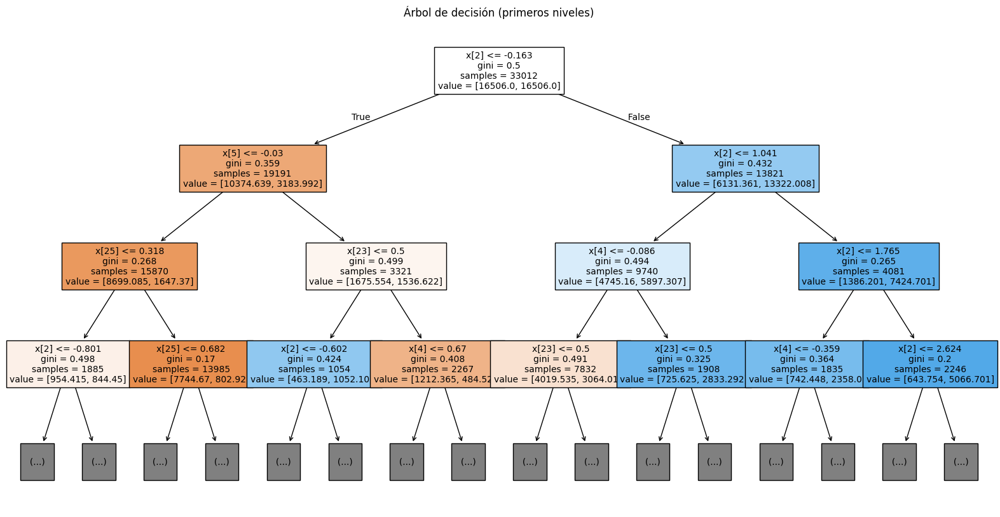

In [44]:
modelo_arbol_leve = leve_pipeline.named_steps['classifier']
plt.figure(figsize=(20, 10))
plot_tree(modelo_arbol_leve, filled=True, max_depth=3, fontsize=10)
plt.title("Árbol de decisión (primeros niveles)")
plt.show()

Para que posteriormente sea comparable, se mirarán las metricas predictivas con los datos de testeo:

In [47]:
y_train_leve_test = leve_pipeline.predict(X_test)


print(confusion_matrix(y_test, y_train_leve_test))
print(accuracy_score(y_test, y_train_leve_test))
print(f1_score(y_test, y_train_leve_test, pos_label='yes'))

[[6435  925]
 [ 348  546]]
0.8457717470317422
0.4617336152219873





---


Con un f1_score del 74% aproximadamente, se puede notar que el modelo regulado levemente entrega peores resultados que el no regulado en base a la muestra de entrenamiento y si vemos la matriz de confusión, podemos notar que los falsos positivos llegan a 2464 y los falsos negativos solo a 47, indicando en este caso que, como se mostró en el enunciado, con este nuevo modelo hay un mayor proporción de clientes que no son de interés, donde se aplica un gasto innecesario de marketing y por el otro lado hay una menor cantidad de clientes perdidos gracias a la menor cantidad de falsos negativos en la predicción con el conjunto de entrenamiento, sin embargo aún falta revisar como predice con nuevos datos.


---


### Pregunta 1.9

Entrene un árbol clasificador con profundad máxima del árbol igual a 8. Llamaremos a este, "modelo regularizado". Asegúrese de que el modelo sea capaz de lidiar con potenciales desbalances. Luego, despliege el $F_1\ Score$ del modelo sobre la base de entrenamiento.

Grafique una representación del árbol entrenado. ¿Qué puede decir sobre este modelo no regularizado?


In [48]:
modelo_regularizado = DecisionTreeClassifier(
    max_depth=8,
    class_weight='balanced',
    random_state=123
)

regularizado_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', modelo_regularizado)
])

regularizado_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('drop_cols',
                                  ColumnDropper(columns_to_drop=['day_of_week'])),
                                 ('transform',
                                  ColumnTransformer(transformers=[('num',
                                                                   Pipeline(steps=[('scaler',
                                                                                    StandardScaler())]),
                                                                   ['age',
                                                                    'balance',
                                                                    'duration',
                                                                    'campaign',
                                                                    'pdays',
                                                                    'previous']),
                                                                  ('cat',
                                                                   Pipeline(steps=[('onehot',
                                                                                    OneHotEncoder(handle_unknown='ignore',
                                                                                                  sparse_outp...
                                                                   ['default',
                                                                    'housing',
                                                                    'loan']),
                                                                  ('ordinal',
                                                                   Pipeline(steps=[('ordinal',
                                                                                    OrdinalEncoder(categories=[['jan',
                                                                                                                'feb',
                                                                                                                'mar',
                                                                                                                'apr',
                                                                                                                'may',
                                                                                                                'jun',
                                                                                                                'jul',
                                                                                                                'aug',
                                                                                                                'sep',
                                                                                                                'oct',
                                                                                                                'nov',
                                                                                                                'dec'],
                                                                                                               ['primary',
                                                                                                                'secondary',
                                                                                                                'tertiary']])),
                                                                                   ('minmax',
                                                                                    MinMaxScaler())]),
                                                                   ['month',
                                                                    'education'])]))])),
                ('classifier',
                 DecisionTreeCl

In [49]:
y_train_reg = regularizado_pipeline.predict(X_train)


print(confusion_matrix(y_train, y_train_reg))
print(accuracy_score(y_train, y_train_reg))
print(f1_score(y_train, y_train_reg, pos_label='yes'))

[[24652  4783]
 [  452  3125]]
0.8414213013449655
0.5441880713974749


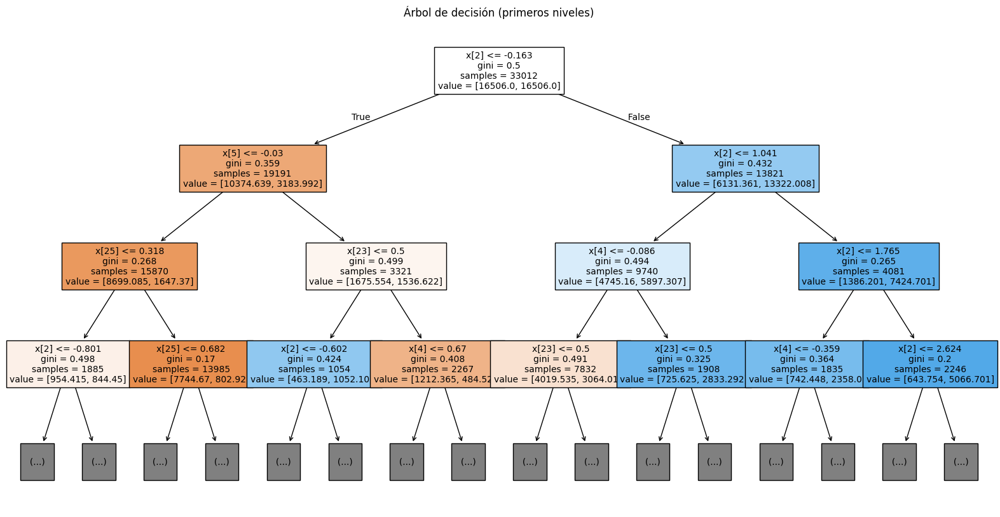

In [53]:
modelo_arbol_reg = regularizado_pipeline.named_steps['classifier']
plt.figure(figsize=(20, 10))
plot_tree(modelo_arbol_reg, filled=True, max_depth=3, fontsize=10)
plt.title("Árbol de decisión (primeros niveles)")
plt.show()

Para que sea comparable posteriormente se realizan las métricas en este sector:

In [54]:
y_reg_test = regularizado_pipeline.predict(X_test)


print(confusion_matrix(y_test, y_reg_test))
print(accuracy_score(y_test, y_reg_test))
print(f1_score(y_test, y_reg_test, pos_label='yes'))

[[6180 1180]
 [ 187  707]]
0.8343833292948873
0.5084501977705861





---


En este nuevo modelo, podemos observar que el f1_score para los datos de entrenamiento es de 54% aproximadamente, lo que indica que el modelo no está prediciendo bien las clases positivas de la data de entrenamiento debido a una gran cantidad de falsos positivos dentro de la predicción


---


### Pregunta 1.10

Entrene 20 árboles de clasificación. Cada uno de ellos debe estar entrenado fijando la profundidad máxima del árbol `max_depth` igual a $n \in [1,20]$. Obtenga el $F_1\ Score$ de cada árbol con la base de entrenamiento y la base de prueba.

Gafique en una misma figura $F_1\ Score$ de entrenamiento contra $n$ y $F_1\ Score$ de prueba contra $n$ (Eje X = $n$). ¿Cuál parece ser el parámetro óptimo $n^*$ para el árbol? ¿Qué puede decir sobre el parámetro sobre _overfitting_ y generalización?

In [62]:
df_f1_scores = pd.DataFrame(columns=['Profundidad', 'F1 Score train', 'F1 Score test'])
for i in range(20):
    modelo_arbol = DecisionTreeClassifier(
        max_depth=i+1,
        class_weight='balanced',
        random_state=123
    )
    
    arbol_pipeline = Pipeline([
        ('preprocessing', preprocessor),
        ('classifier', modelo_arbol)
    ])
    
    arbol_pipeline.fit(X_train, y_train)
    
    y_train_pred = arbol_pipeline.predict(X_train)
    y_test_pred = arbol_pipeline.predict(X_test)
    f1_train = f1_score(y_train, y_train_pred, pos_label='yes')
    f1_test = f1_score(y_test, y_test_pred, pos_label='yes')
    df_f1_scores = pd.concat([df_f1_scores, pd.DataFrame({
        'Profundidad': [i+1],
        'F1 Score train': [f1_train],
        'F1 Score test': [f1_test]
    })], ignore_index=True)

C:\Users\juan2\AppData\Local\Temp\ipykernel_19716\1398695596.py:20: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [61]:
fig_f1 = px.line(df_f1_scores, x='Profundidad', y=['F1 Score train', 'F1 Score test'],
                 title='F1 Score vs Profundidad del Árbol de Decisión',
                 labels={'value': 'F1 Score', 'Profundidad': 'Profundidad del Árbol'})
fig_f1.update_layout(yaxis_title='F1 Score', xaxis_title='Profundidad del Árbol')
fig_f1.show()




---


Viendo el gráfico se puede notar que el n* optimo que se puede tomar sería un n=10, donde se encuentra la mejor predicción para los datos de testeo con un f1_score del 52% aproximadamente, y para los datos de entrenamiento se tiene un f_score del 60% aproximadamente. Por otro lado, el gráfico hace notar que mientras más aumenta el numero de profundidad del arbol, mayor es el overfitting que hace a los datos de entrenamiento y es por esto que genera una menor predicción a los datos de testeo, llegando a su peak en n=10 y bajando progresivamente su capacidad de predicción a medida que aumenta la profundidad. Viendo la generalización, con n=10 tiende a aprender bien el modelo y generalizar mejor que en los otros casos, sin embargo a medida que aumenta o disminuye profundidad teniendo como peak el 10, el modelo se vuelve poco generalizador o bastante debil respectivamente.


---


### Pregunta 1.11

En esta pregunta deberá entrenar _Random orest Classifier_ realizando un ejercicio previo de _hyperparameter tuning_.

Realice _Cross Validation_ con un _folding_ con `K=5` y calcule $F_1\ Score$ de todas las posibles combinaciones de los siguientes parámetros:

- `n_estimators = {100, 1000}`
- `max_depth = {10, 50, 100}`
- `min_samples_leaf = {2, 4}`

Determine la mejor combinación de parámetros y vuelva a entrenar su bosque con esta. Finalmente, reporte el $F_1\ Score$ con la muestra de prueba.

Cuando realice _Cross Validation_ y cuando entrene el modelo final, asegúrese de que el modelo sea capaz de lidiar con potenciales desbalances. Para esto se recomienda leer la documentación oficial de la *clase* `RandomForestClassifier()` (parámetros de inicialización): https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html.



In [64]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

In [68]:
param_grid = {
    'classifier__n_estimators': [100, 1000],
    'classifier__max_depth': [10, 50, 100],
    'classifier__min_samples_leaf': [2, 4]
}

rf_model = RandomForestClassifier(
    class_weight='balanced',   # importante para tratar desbalance
    random_state=123
)

rf_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', rf_model)
])

In [69]:
# Definimos la métrica F1 para usar en GridSearch
f1 = make_scorer(f1_score)

# Búsqueda de hiperparámetros
grid_search = GridSearchCV(
    estimator=rf_pipeline,
    param_grid=param_grid,
    scoring=f1,
    cv=5,
    n_jobs=-1,  # usa todos los núcleos disponibles
    verbose=2
)

# Entrenamos sobre el conjunto de entrenamiento
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


c:\Users\juan2\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan]



GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        Pipeline(steps=[('drop_cols',
                                                         ColumnDropper(columns_to_drop=['day_of_week'])),
                                                        ('transform',
                                                         ColumnTransformer(transformers=[('num',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['age',
                                                                                           'balance',
                                                                                           'duration',
                                                                                           'campaign',
                                                                                           'pdays',
                                                                                           'previous']),
                                                                                         ('cat',
                                                                                          Pipeline(steps=[('onehot',
                                                                                                           OneHotEncoder(handle_...
                                                                                                                                       'tertiary']])),
                                                                                                          ('minmax',
                                                                                                           MinMaxScaler())]),
                                                                                          ['month',
                                                                                           'education'])]))])),
                                       ('classifier',
                                        RandomForestClassifier(class_weight='balanced',
                                                               random_state=123))]),
             n_jobs=-1,
             param_grid={'classifier__max_depth': [10, 50, 100],
                         'classifier__min_samples_leaf': [2, 4],
                         'classifier__n_estimators': [100, 1000]},
             scoring=make_scorer(f1_score, response_method='predict'),
             verbose=2)

In [70]:
grid_search.best_params_

{'classifier__max_depth': 10,
 'classifier__min_samples_leaf': 2,
 'classifier__n_estimators': 100}

In [71]:
# Mejor modelo ya está reentrenado con los mejores hiperparámetros
best_model = grid_search.best_estimator_

# Predicciones sobre test
y_test_pred = best_model.predict(X_test)

# F1 Score en test
f1_test = f1_score(y_test, y_test_pred, average='weighted')
f1_test

0.8722233588905755

Se puede notar que el f1_score con el modelo entrenado con los mejores parametros es de un 87% aproximadamente, indicando lo bien que predice el modelo los nuevos datos ingresados

### Pregunta 1.12

En esta pregunta deberá entrenar _XGBpost Classifier_ realizando un ejercicio previo de _hyperparameter tuning_.

Repita el ejercicio de _Cross Validation_ anterior, pero está vez evaluando:

- `n_estimators = {100, 1000}`
- `max_depth = {5, 50, 100}`
- `learning_rate = {0.05, 0.1, 0.5}`
- `max_leaves= {2, 4, 10}`

Determine la mejor combinación de parámetros y vuelva a entrenar su bosque con esta, reportando el $F_1\ Score$ con la muestra de prueba.

Asegúrese de que sus modelos sean capaces de lidiar con potenciales desbalances. Para esto se recomienda leer la documentación oficial de la *clase* `XGBClassifier()` (parámetros de inicialización): https://xgboost.readthedocs.io/en/latest/python/python_api.html.


In [74]:
y_train_encoded = y_train.map({'no': 0, 'yes': 1})
y_test_encoded = y_test.map({'no': 0, 'yes': 1})

In [72]:
from xgboost import XGBClassifier

xgb_model = XGBClassifier(
    scale_pos_weight=1,       # puedes ajustarlo manualmente si conoces el desbalance
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=123
)

# Crear pipeline con preprocesamiento
xgb_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('classifier', xgb_model)
])

In [75]:
param_grid_xgb = {
    'classifier__n_estimators': [100, 1000],
    'classifier__max_depth': [5, 50, 100],
    'classifier__learning_rate': [0.05, 0.1, 0.5],
    'classifier__max_leaves': [2, 4, 10]
}

f1_xgb = make_scorer(f1_score, average='weighted')

grid_search = GridSearchCV(
    estimator=xgb_pipeline,
    param_grid=param_grid_xgb,
    scoring=f1_xgb,
    cv=5,
    n_jobs=-1,
    verbose=2
)

# Entrenar búsqueda
grid_search.fit(X_train, y_train_encoded)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


c:\Users\juan2\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\training.py:183: UserWarning:

[23:38:08] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        Pipeline(steps=[('drop_cols',
                                                         ColumnDropper(columns_to_drop=['day_of_week'])),
                                                        ('transform',
                                                         ColumnTransformer(transformers=[('num',
                                                                                          Pipeline(steps=[('scaler',
                                                                                                           StandardScaler())]),
                                                                                          ['age',
                                                                                           'balance',
                                                                                           'duration',
                                                                                           'campaign',
                                                                                           'pdays',
                                                                                           'previous']),
                                                                                         ('cat',
                                                                                          Pipeline(steps=[('onehot',
                                                                                                           OneHotEncoder(handle_...
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=None,
                                                      num_parallel_tree=None, ...))]),
             n_jobs=-1,
             param_grid={'classifier__learning_rate': [0.05, 0.1, 0.5],
                         'classifier__max_depth': [5, 50, 100],
                         'classifier__max_leaves': [2, 4, 10],
                         'classifier__n_estimators': [100, 1000]},
             scoring=make_scorer(f1_score, response_method='predict', average=weighted),
             verbose=2)

In [76]:
grid_search.best_params_

{'classifier__learning_rate': 0.1,
 'classifier__max_depth': 5,
 'classifier__max_leaves': 10,
 'classifier__n_estimators': 1000}

In [77]:
# Modelo entrenado con los mejores hiperparámetros
best_xgb = grid_search.best_estimator_

# Evaluación en conjunto de prueba
y_test_pred = best_xgb.predict(X_test)
f1_test = f1_score(y_test_encoded, y_test_pred, average='weighted')
f1_test

0.9070504305128456

Se puede notar que el f1_score es el mayor hasta el momento con un nivel de predicción de los datos de testeo del 91% aproximadamente

### Pregunta 1.13

Entrene un modelo _Naïve Bayes_. Asegúrese de que el modelo sea capaz de lidiar con potenciales desbalances. Para esto se recomienda leer la documentación oficial de la *clase* `GaussianNB()` (parámetros de inicialización): https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html.


Despliege el $F_1\ Score$ del modelo sobre la base de entrenamiento.



---



## Análisis Comparativo de Modelos de Clasificación


### Pregunta 1.14

Evalúe y compare el desempeño de los modelos teniendo en cuenta la naturaleza del conjunto de datos. ¿Cómo afectó el desbalance a cada modelo? ¿Qué modelo manejó mejor el balance o desbalance de clases y cuáles son sus conclusiones generales sobre su rendimiento comparado?

Para que la comparación sea clara, es útil indicar qué métricas de evaluación utilizo para comparar los modelos (por ejemplo, F1-score, precisión, recall, AUC, etc.).




---


*Escriba* su respuesta en esta celda...


---


# KMeans & PCA

La guerra comercial desatada levanta un montón de preguntas de interés en economía. Una de estas es: ¿Qué países sufrirán de forma similar las consecuencias de esta? ¿Quiénes serían ganadores? ¿Quienes serían perdedores?

En esta parte exploraremos el aporte que los métodos de Clustering de Machine Learning pueden hacer a la respuesta de esta cuestión. Nos enfocaremos en variables relacionadas al comercio exterior para determinar similitud entre grupos de países. Más específicamente, en variables relacionadas a las exportaciones.

Para esto, considere las siguientes variables que describen el perfil exportador de cada país:

- GDP growth (annual %)
- Agricultural raw materials exports (% of merchandise exports)
- Computer, communications and other services (% of commercial service exports)
- Exports of goods and services (% of GDP)
- Food exports (% of merchandise exports)
- Fuel exports (% of merchandise exports)
- High-technology exports (% of manufactured exports)
- ICT service exports (% of service exports, BoP)
- Insurance and financial services (% of service exports, BoP)
- International tourism, receipts (% of total exports)
- Manufactures exports (% of merchandise exports)
- Merchandise exports to high-income economies (% of total merchandise exports)
- Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)
- Ores and metals exports (% of merchandise exports)
- Taxes on exports (% of tax revenue)
- Transport services (% of commercial service exports)


La idea será determinar similitud entre países y las variables qué son más relevantes a la hora de determinarla.

Debido a que 2023 es el año reciente con una mayor riqueza de datos, y debido a que nos interesan cambios respecto al _status quo_ en el contexto actual, trabajaremos con datos sólo de aquel año.

Database Source: World bank & Trade Analysis Information System.



### Pregunta 2.0

Cargue la base de datos disponible en el siguiente link: https://raw.githubusercontent.com/olherreragz/EAE3709-2025-1/refs/heads/main/T2_data/Data.cs.

En el siguiente link podrá encontrar información adicional sobre el _dataset_ por si lo llega a necesitar: https://github.com/olherreragz/EAE3709-2025-1/blob/main/T2_data/Series_Metadata.csv.

Elimine las columnas `"Series Code"` y `"Country Code"`. Luego, transforme su _dataframe_ de formato _Long_ a _Wide_. Su _dataframe_ final deberá contener una columna que indique el nombre del país y columnas que indiquen la medida de exportación correspondiente:

`<Country>, <SeriesName1>, <SeriesName2> ....`



![Long to Wide Format](https://tavareshugo.github.io/r-intro-tidyverse-gapminder/fig/07-data_shapes.png)




In [78]:
#librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist

In [79]:
url = 'https://raw.githubusercontent.com/olherreragz/EAE3709-2025-1/refs/heads/main/T2_data/Data.csv'
df = pd.read_csv(url)
drop_columns = ['Series Code', 'Country Code']
df.drop(columns=drop_columns, inplace=True)
df = df.pivot(index='Country Name', columns='Series Name', values='2023 [YR2023]')
df.head()

Series Name,Agricultural raw materials exports (% of merchandise exports),Computer; communications and other services (% of commercial service exports),Exports of goods and services (% of GDP),Food exports (% of merchandise exports),Fuel exports (% of merchandise exports),GDP growth (annual %),High-technology exports (% of manufactured exports),ICT service exports (% of service exports; BoP),Insurance and financial services (% of service exports; BoP),International tourism; receipts (% of total exports),Manufactures exports (% of merchandise exports),Merchandise exports to high-income economies (% of total merchandise exports),Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports),Ores and metals exports (% of merchandise exports),Taxes on exports (% of tax revenue),Transport services (% of commercial service exports)
Country Name,,,,,,,,,,,,,,,,
Afghanistan,..,..,16.7751362822863,..,..,2.71088679128353,..,..,..,..,..,12.8798269363707,9.68241869729934,..,..,..
Africa Eastern and Southern,1.93287526195653,35.9298385263195,24.3483372544611,14.285851632509,25.4254224001233,2.32013780158925,5.80516538196113,6.10657347896149,6.08028700896879,..,29.1304853698777,44.3959450802976,0.471789673271105,23.4925994471713,..,22.9754549072797
Africa Western and Central,3.80482687815641,23.7057568350145,..,12.9874441377748,61.3705691120184,3.3547328190002,..,5.69176863421842,14.9934752391386,..,6.76897203140647,54.1428772898838,3.17153807284374,4.3390849886261,..,36.2200117483328
Albania,0.406032063201426,24.4301090197124,38.6650817896799,11.9640780632637,6.34538423879421,3.93662525742167,0.682326849473647,3.01397608748124,0.662505307988438,..,56.6139655531231,77.7081307571647,19.5159727248964,5.34944752843742,..,10.9287529629646
Algeria,..,59.1626427564765,23.6195363708424,..,..,4.10000000000004,..,2.21311390791552,10.2830758414755,..,..,80.1800299622258,6.36723723188521,..,..,25.4709095419937


### Pregunta 2.1

Debido a que la pregunta de interés es sobre identificación de grupos de países, elime filas donde `Country Name` sea igual a cualquiera de los siguientes valores:

- "Africa Eastern and Southern"  
- "Africa Western and Central"  
- "Arab World"  
- "Caribbean small states"  
- "Central Europe and the Baltics"  
- "Early-demographic dividend"  
- "East Asia & Pacific"  
- "East Asia & Pacific (IDA & IBRD countries)"  
- "East Asia & Pacific (excluding high income)"  
- "Euro area"  
- "Europe & Central Asia"  
- "Europe & Central Asia (IDA & IBRD countries)"  
- "Europe & Central Asia (excluding high income)"  
- "European Union"  
- "Fragile and conflict affected situations"  
- "Heavily indebted poor countries (HIPC)"  
- "High income"  
- "IBRD only"  
- "IDA & IBRD total"  
- "IDA blend"  
- "IDA only"  
- "IDA total"  
- "Late-demographic dividend"  
- "Latin America & Caribbean"  
- "Latin America & Caribbean (excluding high income)"  
- "Latin America & the Caribbean (IDA & IBRD countries)"  
- "Least developed countries: UN classification"  
- "Low & middle income"  
- "Low income"  
- "Lower middle income"  
- "Middle East & North Africa"  
- "Middle East & North Africa (IDA & IBRD countries)"  
- "Middle East & North Africa (excluding high income)"  
- "Middle income"  
- "North America"  
- "Not classified"  
- "OECD members"  
- "Other small states"  
- "Pacific island small states"  
- "Post-demographic dividend"  
- "Pre-demographic dividend"  
- "Small states"  
- "South Asia"  
- "South Asia (IDA & IBRD)"  
- "Sub-Saharan Africa"  
- "Sub-Saharan Africa (IDA & IBRD countries)"  
- "Sub-Saharan Africa (excluding high income)"  
- "Upper middle income"  
- "World"




In [80]:
drop_countries = ["Africa Eastern and Southern",
"Africa Western and Central",
"Arab World",
"Caribbean small states",
"Central Europe and the Baltics",
"Early-demographic dividend",
"East Asia & Pacific",
"East Asia & Pacific (IDA & IBRD countries)",
"East Asia & Pacific (excluding high income)",
"Euro area",
"Europe & Central Asia",
"Europe & Central Asia (IDA & IBRD countries)",
"Europe & Central Asia (excluding high income)",
"European Union",
"Fragile and conflict affected situations",
"Heavily indebted poor countries (HIPC)",
"High income",
"IBRD only",
"IDA & IBRD total",
"IDA blend",
"IDA only",
"IDA total",
"Late-demographic dividend",
"Latin America & Caribbean",
"Latin America & Caribbean (excluding high income)",
"Latin America & the Caribbean (IDA & IBRD countries)",
"Least developed countries: UN classification",
"Low & middle income",
"Low income",
"Lower middle income",
"Middle East & North Africa",
"Middle East & North Africa (IDA & IBRD countries)",
"Middle East & North Africa (excluding high income)",
"Middle income",
"North America",
"Not classified",
"OECD members",
"Other small states",
"Pacific island small states",
"Post-demographic dividend",
"Pre-demographic dividend",
"Small states",
"South Asia",
"South Asia (IDA & IBRD)",
"Sub-Saharan Africa",
"Sub-Saharan Africa (IDA & IBRD countries)",
"Sub-Saharan Africa (excluding high income)",
"Upper middle income",
"World"]

df = df.drop(drop_countries)


### Pregunta 2.2

Reemplace todos los valores `".."` por `NA`. Luego, transforme las columnas a variables numéricas y despliegue estadísticas descriptivas.


In [81]:
df = df.replace('..', np.nan)
df = df.apply(pd.to_numeric, errors='coerce')
df.describe()

C:\Users\juan2\AppData\Local\Temp\ipykernel_19716\22953597.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



Series Name,Agricultural raw materials exports (% of merchandise exports),Computer; communications and other services (% of commercial service exports),Exports of goods and services (% of GDP),Food exports (% of merchandise exports),Fuel exports (% of merchandise exports),GDP growth (annual %),High-technology exports (% of manufactured exports),ICT service exports (% of service exports; BoP),Insurance and financial services (% of service exports; BoP),International tourism; receipts (% of total exports),Manufactures exports (% of merchandise exports),Merchandise exports to high-income economies (% of total merchandise exports),Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports),Ores and metals exports (% of merchandise exports),Taxes on exports (% of tax revenue),Transport services (% of commercial service exports)
count,149.000000,161.000000,158.000000,149.000000,145.000000,195.000000,147.000000,157.000000,152.000000,0.0,149.000000,205.000000,192.000000,149.000000,22.000000,161.000000
mean,2.726255,35.005284,45.398868,24.136526,14.275881,3.241160,11.352849,10.234009,5.732781,NaN,42.098438,60.914241,5.096570,9.476862,2.624425,20.583359
std,7.416283,23.550764,33.331007,23.862474,23.215387,6.641153,13.507894,11.534976,7.703914,NaN,29.236666,24.978469,11.628976,15.470820,4.899022,16.870115
min,0.000000,0.935706,1.108109,0.079874,0.000000,-20.111576,0.000000,0.043145,0.008135,NaN,0.210353,0.121224,0.000034,0.000000,0.000002,0.663447
25%,0.343928,13.309551,23.637110,8.338115,0.498740,1.168088,2.226174,2.681207,1.319000,NaN,15.347126,43.902677,0.244645,1.353868,0.046153,7.784412
50%,0.794963,32.273353,38.790357,15.056512,4.097826,2.960181,6.030929,7.285006,3.203366,NaN,37.251121,65.682415,0.942470,3.138350,0.232860,15.739129
75%,2.120083,53.862266,56.494967,32.790842,15.770449,4.987486,16.841983,12.745838,7.163361,NaN,68.665103,82.370504,3.269713,8.391231,1.419763,27.632283
max,63.703068,95.860793,212.530618,98.210416,95.516439,75.061377,72.315489,61.766896,55.672826,NaN,94.990393,97.770966,96.949670,76.471800,15.578989,86.950670


### Pregunta 2.3

Grafique la distribución empírica de todas las variables numéricas del dataset. Comente sobre cada una de ellas.

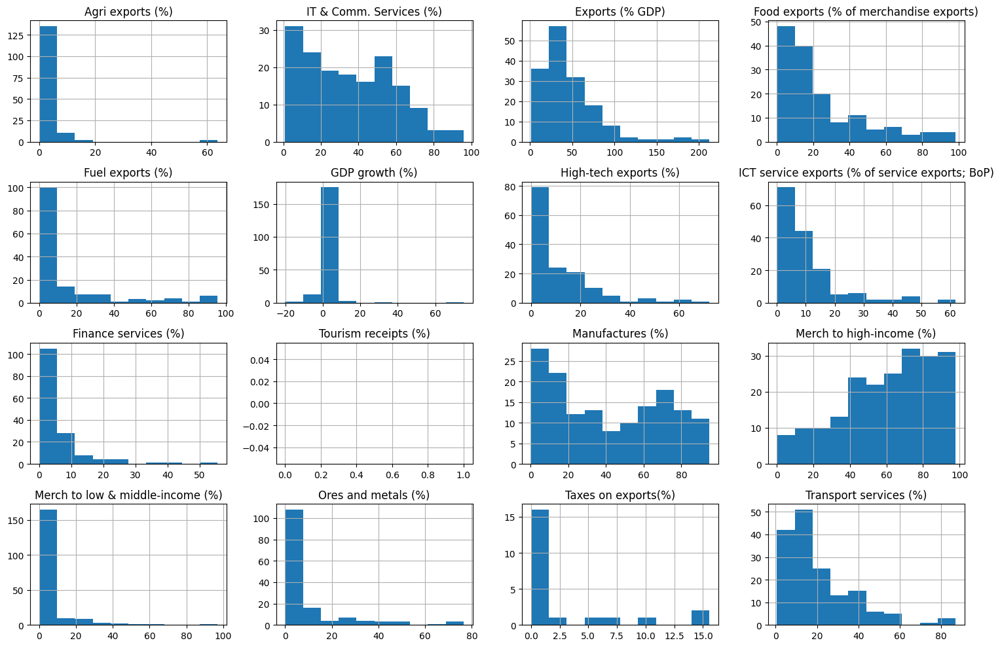

In [82]:
# Diccionario de nombres simplificados
nombres_simplificados = {
    'Agricultural raw materials exports (% of merchandise exports)': 'Agri exports (%)',
    'Computer; communications and other services (% of commercial service exports)': 'IT & Comm. Services (%)',
    'Exports of goods and services (% of GDP)': 'Exports (% GDP)',
    'Fuel exports (% of merchandise exports)': 'Fuel exports (%)',
    'GDP growth (annual %)': 'GDP growth (%)',
    'High-technology exports (% of manufactured exports)': 'High-tech exports (%)',
    'Insurance and financial services (% of service exports; BoP)': 'Finance services (%)',
    'International tourism; receipts (% of total exports)': 'Tourism receipts (%)',
    'Manufactures exports (% of merchandise exports)': 'Manufactures (%)',
    'Transport services (% of commercial service exports)': 'Transport services (%)',
    'Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)': 'Merch to low & middle-income (%)',
    'Ores and metals exports (% of merchandise exports)': 'Ores and metals (%)',
    'Taxes on exports (% of tax revenue)': 'Taxes on exports(%)',
    'Merchandise exports to high-income economies (% of total merchandise exports)': 'Merch to high-income (%)'
}

df_temp = df.rename(columns=nombres_simplificados)
# Grafico
df_temp.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()




---


| Variable                             | Observación Principal                                                                                              |
| ------------------------------------ | ------------------------------------------------------------------------------------------------------------------ |
| **Agri exports (%)**                 | Altamente sesgada a la izquierda. La mayoría de los países exportan poco en materias primas agrícolas.             |
| **IT & Comm. Services (%)**          | Distribución relativamente uniforme con ligera asimetría derecha. Amplia diversidad de exportación en este sector. |
| **Exports (% GDP)**                  | Sesgo a la derecha, con algunos países exportando una gran proporción del PIB. Posibles outliers.                  |
| **Food exports (%)**                 | Concentrada cerca del 0-20%, sesgo a la derecha. Exportaciones de alimentos son bajas en la mayoría.               |
| **Fuel exports (%)**                 | Sesgo extremo a la derecha. La mayoría exporta muy poco combustible, pero hay grandes exportadores puntuales.      |
| **GDP growth (%)**                   | Levemente simétrica pero con presencia de valores extremos negativos (recesiones). La mayoría crece entre 0 y 10%. |
| **High-tech exports (%)**            | Alta concentración en valores bajos, pero con cola derecha larga. Pocos países son líderes tecnológicos.           |
| **ICT service exports (%)**          | Sesgo fuerte a la derecha. Gran mayoría exporta poco en servicios TIC.                                             |
| **Finance services (%)**             | Distribución altamente asimétrica a la derecha. Pocos países tienen altos ingresos financieros externos.           |
| **Tourism receipts (%)**             | No hay datos en esta variable.         |
| **Manufactures (%)**                 | Bimodal: países que exportan muchos o muy pocos manufacturados. Podría dividirse en clusters.                      |
| **Merch to high-income (%)**         | Distribución bastante uniforme entre 0 y 100%, interesante para segmentación de mercados.                          |
| **Merch to low & middle-income (%)** | Similar a la anterior, aunque más concentrada en niveles bajos. Contraparte de la anterior.                        |
| **Ores and metals (%)**              | Fuerte asimetría derecha. Pocos países exportan mucho en esta categoría.                                           |
| **Taxes on exports (%)**             | Mayoría de los valores cercanos a cero. Políticas fiscales comunes favorecen exportaciones sin gravamen.           |
| **Transport services (%)**           | Sesgo a la derecha. La mayoría de países exportan poco en servicios de transporte, pero hay algunos focos altos.   |



---


## Missing Values

### Pregunta 2.4

Realice análisis de valores vacíos y tratamiento de estos. Se premiará mantener el mayor número de observaciones posibles bajo criterios razonables. Luego de esta pregunta no deben quedar nulos en el _dataframe_ a utilizar.


In [83]:
total_missings = df.isnull().sum().sort_values(ascending=False)
total_missings #observamos el ranking del total de missings por variable.
total_datos = df.isnull().count()
total_datos #observamos el total de datos por variable.
percent_missings = (total_missings/total_datos).sort_values(ascending=False)*100
percent_missings[percent_missings > 0] #mostramos sólo variables con Missings

Series Name
International tourism; receipts (% of total exports)                                                                 100.000000
Taxes on exports (% of tax revenue)                                                                                   89.861751
Fuel exports (% of merchandise exports)                                                                               33.179724
High-technology exports (% of manufactured exports)                                                                   32.258065
Agricultural raw materials exports (% of merchandise exports)                                                         31.336406
Food exports (% of merchandise exports)                                                                               31.336406
Manufactures exports (% of merchandise exports)                                                                       31.336406
Ores and metals exports (% of merchandise exports)                                          


------------------------

Se eliminará toda la columna de turismo internacional por la falta de datos al 100%. Los taxes on exports también serán eliminados, pues casi el 90% de la data es missing value y esto genera una baja fiabilidad de la variable. El resto de la data tiene menos del 35% de data faltante, por lo que se puede manejar imputando. Para las variables que sean asimétricas (según lo visto en el histograma) se utilizará la mediana, para el resto, se utilizará la media, por simplificación.

-----------------------

In [84]:
# eliminamos columnas con la mayoria (>~90%) de valores faltantes
df.drop(columns=['International tourism; receipts (% of total exports)', 'Taxes on exports (% of tax revenue)'], inplace=True)

# imputaciones asimetrías fuerte -> mediana

df['Fuel exports (% of merchandise exports)'] = df['Fuel exports (% of merchandise exports)'].fillna(
    df['Fuel exports (% of merchandise exports)'].median())

df['High-technology exports (% of manufactured exports)'] = df['High-technology exports (% of manufactured exports)'].fillna(
    df['High-technology exports (% of manufactured exports)'].median())

df['Manufactures exports (% of merchandise exports)'] = df['Manufactures exports (% of merchandise exports)'].fillna(
    df['Manufactures exports (% of merchandise exports)'].mean())

df['Ores and metals exports (% of merchandise exports)'] = df['Ores and metals exports (% of merchandise exports)'].fillna(
    df['Ores and metals exports (% of merchandise exports)'].median())

df['Agricultural raw materials exports (% of merchandise exports)'] = df['Agricultural raw materials exports (% of merchandise exports)'].fillna(
    df['Agricultural raw materials exports (% of merchandise exports)'].median())

df['Food exports (% of merchandise exports)'] = df['Food exports (% of merchandise exports)'].fillna(
    df['Food exports (% of merchandise exports)'].median())

df['Insurance and financial services (% of service exports; BoP)'] = df['Insurance and financial services (% of service exports; BoP)'].fillna(
    df['Insurance and financial services (% of service exports; BoP)'].median())

df['ICT service exports (% of service exports; BoP)'] = df['ICT service exports (% of service exports; BoP)'].fillna(
    df['ICT service exports (% of service exports; BoP)'].median())

df['Exports of goods and services (% of GDP)'] = df['Exports of goods and services (% of GDP)'].fillna(
    df['Exports of goods and services (% of GDP)'].median())

df['Computer; communications and other services (% of commercial service exports)'] = df['Computer; communications and other services (% of commercial service exports)'].fillna(
    df['Computer; communications and other services (% of commercial service exports)'].mean())

df['Transport services (% of commercial service exports)'] = df['Transport services (% of commercial service exports)'].fillna(
    df['Transport services (% of commercial service exports)'].median())

df['Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)'] = df['Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)'].fillna(
    df['Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)'].median())

# simetrías -> media

df['GDP growth (annual %)'] = df['GDP growth (annual %)'].fillna(
    df['GDP growth (annual %)'].mean())

df['Merchandise exports to high-income economies (% of total merchandise exports)'] = df['Merchandise exports to high-income economies (% of total merchandise exports)'].fillna(
    df['Merchandise exports to high-income economies (% of total merchandise exports)'].mean())



In [85]:
df.isnull().sum() #verificamos que no tenemos NaN

Series Name
Agricultural raw materials exports (% of merchandise exports)                                                        0
Computer; communications and other services (% of commercial service exports)                                        0
Exports of goods and services (% of GDP)                                                                             0
Food exports (% of merchandise exports)                                                                              0
Fuel exports (% of merchandise exports)                                                                              0
GDP growth (annual %)                                                                                                0
High-technology exports (% of manufactured exports)                                                                  0
ICT service exports (% of service exports; BoP)                                                                      0
Insurance and financial services (% 

## Outliers

### Pregunta 2.5

Realice análisis de datos _outliers_. De ser necesario aplique un procesamiento de outliers, de no ser necesario justifique.

Se premiará el buen criterio fundamentado.

In [86]:
numericas = df.dtypes[df.dtypes != 'object'].index.tolist() #variables numéricas
numericas

['Agricultural raw materials exports (% of merchandise exports)',
 'Computer; communications and other services (% of commercial service exports)',
 'Exports of goods and services (% of GDP)',
 'Food exports (% of merchandise exports)',
 'Fuel exports (% of merchandise exports)',
 'GDP growth (annual %)',
 'High-technology exports (% of manufactured exports)',
 'ICT service exports (% of service exports; BoP)',
 'Insurance and financial services (% of service exports; BoP)',
 'Manufactures exports (% of merchandise exports)',
 'Merchandise exports to high-income economies (% of total merchandise exports)',
 'Merchandise exports to low- and middle-income economies in Europe & Central Asia (% of total merchandise exports)',
 'Ores and metals exports (% of merchandise exports)',
 'Transport services (% of commercial service exports)']

In [87]:
df.count() #countries antes

Series Name
Agricultural raw materials exports (% of merchandise exports)                                                        217
Computer; communications and other services (% of commercial service exports)                                        217
Exports of goods and services (% of GDP)                                                                             217
Food exports (% of merchandise exports)                                                                              217
Fuel exports (% of merchandise exports)                                                                              217
GDP growth (annual %)                                                                                                217
High-technology exports (% of manufactured exports)                                                                  217
ICT service exports (% of service exports; BoP)                                                                      217
Insurance and financ

In [89]:
import seaborn as sns

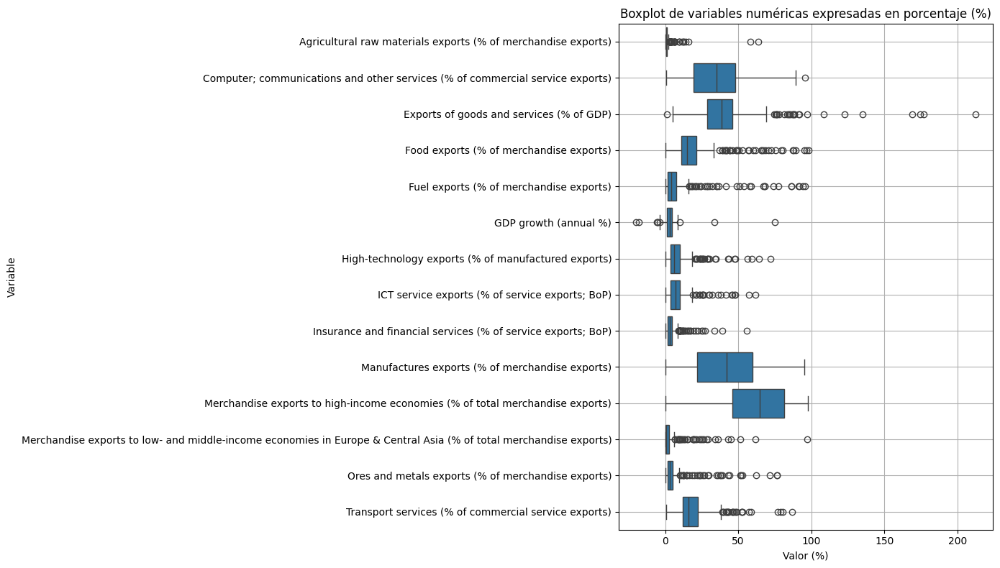

In [90]:
# convertimos las columnas numéricas en formato long
df_long = df[numericas].melt(var_name='Variable', value_name='Porcentaje')

# boxplot
plt.figure(figsize=(14, 8))
sns.boxplot(data=df_long, x='Porcentaje', y='Variable', orient='h')
plt.title('Boxplot de variables numéricas expresadas en porcentaje (%)')
plt.xlabel('Valor (%)')
plt.ylabel('Variable')
plt.grid(True)
plt.tight_layout()
plt.show()

----------

Como no queremos eliminar países para mantener el enfoque macroeconómico, los outliers del dataset serán reemplazando por los valores extremos de la caja de bigotes, de manera que no perdemos países en el análisis pero evitamos valores demasiado alejados de la estructura de la data. Si un valor es menor/mayor que lower/upper, lo reemplará por lower/upper, y los valores dentro del rango continúan igual.

---------

In [91]:
for col in numericas:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Aplicamos winsorizing según el IQR
    df[col] = df[col].clip(lower=lower, upper=upper)

In [92]:
df.count() #countries despues, no han cambiado

Series Name
Agricultural raw materials exports (% of merchandise exports)                                                        217
Computer; communications and other services (% of commercial service exports)                                        217
Exports of goods and services (% of GDP)                                                                             217
Food exports (% of merchandise exports)                                                                              217
Fuel exports (% of merchandise exports)                                                                              217
GDP growth (annual %)                                                                                                217
High-technology exports (% of manufactured exports)                                                                  217
ICT service exports (% of service exports; BoP)                                                                      217
Insurance and financ

## Feature Engineering


### Pregunta 2.6

Realice _feature engineering_ de las variables numéricas (para luego entrenar un modelo _K-Means_ con estas). Realice los ajustes que estime conveniente, pero su tratamiento debe incluir por lo menos estandarización de las variables.

Más adelante se le pedirá comentar sobre los resultados de sus modelos, por lo que considere que sus decisiones podrían condicionar futuras preguntas.



In [93]:
X_numericas = df[numericas].copy()

# Escalar
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_numericas)

# DataFrame final
cluster = pd.DataFrame(X_scaled, columns=numericas)
cluster.describe().T[['mean', 'std']] #deben ser ~0 y ~1.

,mean,std
Agricultural raw materials exports (% of merchandise exports),2.361143e-16,1.002312
Computer; communications and other services (% of commercial service exports),-1.534871e-16,1.002312
Exports of goods and services (% of GDP),-5.157165e-16,1.002312
Food exports (% of merchandise exports),-2.496723e-16,1.002312
Fuel exports (% of merchandise exports),-1.877658e-16,1.002312
GDP growth (annual %),-1.985099e-16,1.002312
High-technology exports (% of manufactured exports),-6.548781e-17,1.002312
ICT service exports (% of service exports; BoP),1.309756e-16,1.002312
Insurance and financial services (% of service exports; BoP),2.251143e-17,1.002312
Manufactures exports (% of merchandise exports),-1.555335e-16,1.002312


## K-Means

### Pregunta 2.7

Considerando el dataframe completo (todas sus columnas atributos), determine el número óptimo de clusters mediante el "Elbow method". Considere un rango $k \in [1, 30]$. Describa el comportamiento observado de la curva.



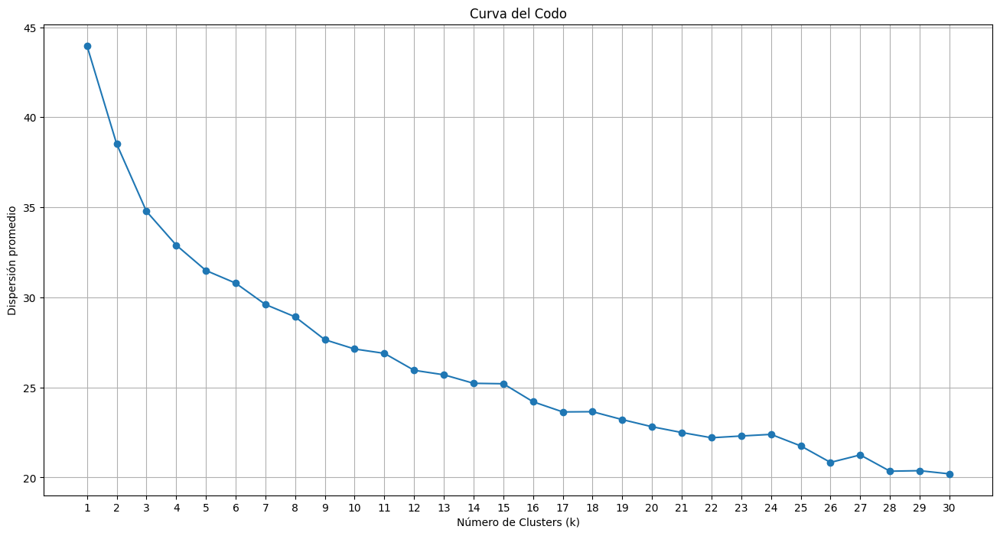

In [94]:
dispersion = []
for k in range(1, 31):
  model = KMeans(n_clusters=k)
  model.fit(df)
  #Distancia euclidiana para cada par (dato - centro del cluster)
  dist_ecl = cdist(df, model.cluster_centers_, 'euclidean')
  #Tomamos la distancia mínima (al centroide más cercano)
  min_dist = np.min(dist_ecl, axis=1)
  #Promediamos: sumamos todas las mínimas distincia y dividimos por la cantidad de datos
  average_dis = sum(min_dist)/len(df)
  dispersion.append(average_dis)

fig = plt.figure(figsize=(16, 8))
plt.plot(range(1, 31), dispersion, marker='o')
plt.xticks(range(1, 31))  # Mostrar todos los valores de k en el eje x
plt.grid(True)
plt.title('Curva del Codo')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Dispersión promedio')
plt.show()




---

Se observa que para clusters el punto de inflexión o “codo” está en torno a k = 3, lo que sugiere que 3 clusters es un buen compromiso entre simplicidad y calidad de agrupamiento. Pues, de 3 en adelante, la curva comienza a tener una pendiente más suave que del cluster 1 al 3.


---


### Pregunta 2.8

Un problema habitual del modelo _K-Means_ es que pierde desempeño a mayor dimensionalidad.

En esta pregunta defina **por lo menos 5 combinaciones de columnas** (mínimo 2 columnas y máximo 4). Para cada combinación determine el número óptimo de clusters mediante el "Elbow method" considerando $k \in [1, 30]$.

Un posible enfoque para lo anterior es tomar un _approach_ estadístico y escoger variables que empíricamente muestran mayores indicios de poder diferenciador entre las observaciones. De todas formas, recuerde que la pregunta de interés es "¿qué países se verán expuestos de forma similar a la guerra comercial?". En este sentido, es altamente recomendable escoger variables con una mayor relación al fenómeno de la guerra comercial, ya que puede ser útil para discernir de qué forma podría verse expuesto cada grupo.


In [95]:
# se definen las combinaciones
combinaciones = {
    "Exportación Agrícola y Tecnológica": [
        'Agricultural raw materials exports (% of merchandise exports)',
        'High-technology exports (% of manufactured exports)'
    ],
    "Comercio Servicios vs Manufacturas": [
        'Computer; communications and other services (% of commercial service exports)',
        'Transport services (% of commercial service exports)',
        'Manufactures exports (% of merchandise exports)'
    ],
    "Relación con economías desarrolladas": [
        'Merchandise exports to high-income economies (% of total merchandise exports)',
        'ICT service exports (% of service exports; BoP)'
    ],
    "Exposición Energética y Materias Primas": [
        'Fuel exports (% of merchandise exports)',
        'Ores and metals exports (% of merchandise exports)',
        'Agricultural raw materials exports (% of merchandise exports)'
    ],
    "Exportaciones y Crecimiento Económico": [
        'Exports of goods and services (% of GDP)',
        'GDP growth (annual %)',
        'Food exports (% of merchandise exports)'
    ]
}

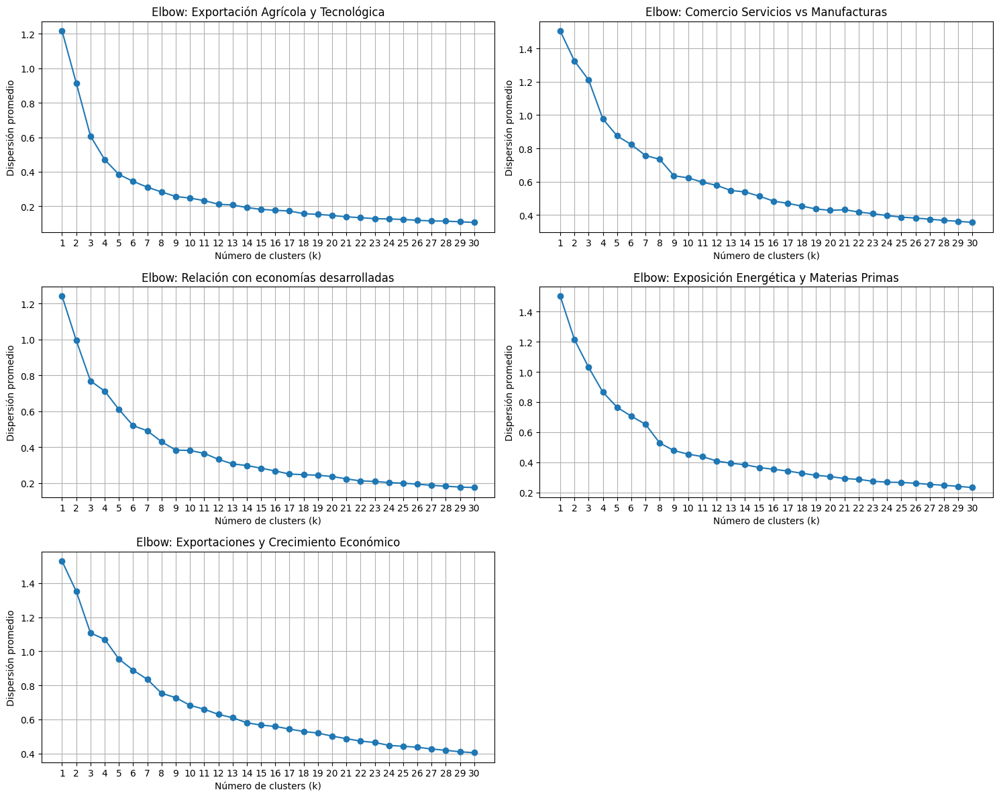

In [96]:
resultados_elbow = {}

# elbow method
for nombre, columnas in combinaciones.items():
    X_temp = df[columnas].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_temp)

    dispersion = []
    for k in range(1, 31):
        model = KMeans(n_clusters=k, random_state=42)
        model.fit(X_scaled)
        dist_ecl = cdist(X_scaled, model.cluster_centers_, 'euclidean')
        min_dist = np.min(dist_ecl, axis=1)
        average_dis = sum(min_dist)/len(X_scaled)
        dispersion.append(average_dis)

    resultados_elbow[nombre] = dispersion

# Graficar
fig, axs = plt.subplots(3, 2, figsize=(15, 12))
axs = axs.flatten()

for i, (nombre, dispersion) in enumerate(resultados_elbow.items()):
    axs[i].plot(range(1, 31), dispersion, marker='o')
    axs[i].set_title(f'Elbow: {nombre}')
    axs[i].set_xlabel('Número de clusters (k)')
    axs[i].set_ylabel('Dispersión promedio')
    axs[i].grid(True)
    axs[i].set_xticks(range(1, 31))

# Ocultar subplots vacíos
if len(combinaciones) < len(axs):
    for j in range(len(combinaciones), len(axs)):
        axs[j].axis('off')

plt.tight_layout()
plt.show()

---
Para las combinaciones se incluyen indicadores de composición de exportaciones (agrícolas, tecnológicas, manufacturas, recursos naturales), así como niveles de integración con economías desarrolladas, ya que estas suelen estar en el centro de tensiones comerciales. Además, se consideran variables de dependencia sectorial (servicios, materias primas) y de desempeño económico (crecimiento y peso del comercio en el PIB), las cuales pueden influir en la vulnerabilidad o resiliencia de los países ante barreras arancelarias o disrupciones del comercio internacional.

Analizamos cada combinación:
* **Exportación Agrícola y Tecnológica**: se recomienda utilizar **3 clusters**, lo que permite capturar diferencias generales entre países con orientación agrícola, tecnológica, o una combinación de ambas. Esta agrupación es adecuada para distinguir patrones amplios de especialización productiva vinculada a la estructura exportadora.

* **Comercio Servicios vs Manufacturas**: se recomienda un valor de **k = 3**, ya que se observan caídas significativas en la dispersión hasta ese punto. Esto sugiere la existencia de tres grandes grupos: países con mayor orientación a servicios, a manufacturas, o un equilibrio entre ambos.

* **Relación con economías desarrolladas**: se justifica **k = 3** por la separación clara entre países con alta, media y baja exposición a economías desarrolladas. Esta distinción permite identificar riesgos diferenciados frente a tensiones comerciales globales.

* **Exposición Energética y Materias Primas**: el uso de **5 clusters** permite distinguir países altamente dependientes de recursos naturales, moderadamente expuestos, y aquellos menos dependientes en diferentes grados. Esta separación es útil para evaluar vulnerabilidades ante shocks en precios de commodities.

* **Exportaciones y Crecimiento Económico**: se sugiere emplear **k = 3**, ya que agrupa a los países en función de su dinamismo económico y nivel de apertura comercial, lo que es relevante para anticipar su sensibilidad frente a cambios en el comercio internacional.




---

### Pregunta 2.9

Escoja la combinación de columnas que considera adecuada emplear, refiriéndose tanto al comportamiento observado de la curva, como al nivel de la métrica empleada al que se alcanza la convergencia.

Estime el modelo con $k$ óptimo y las columnas escogidas. Visualice los grupos graficando _scatterplots_. Considere gráficos en 3 dimensiones si su modelo posee 3 o más variables.

Describa en qué se diferencian los grupos encontrados y de qué manera le podría afectar la guerra comercial a cada uno. Liste una pequeña muestra representativa de los países que contiene cada grupo.


In [97]:
#combinación seleccionada:
comb = ['Merchandise exports to high-income economies (% of total merchandise exports)',
   'ICT service exports (% of service exports; BoP)']

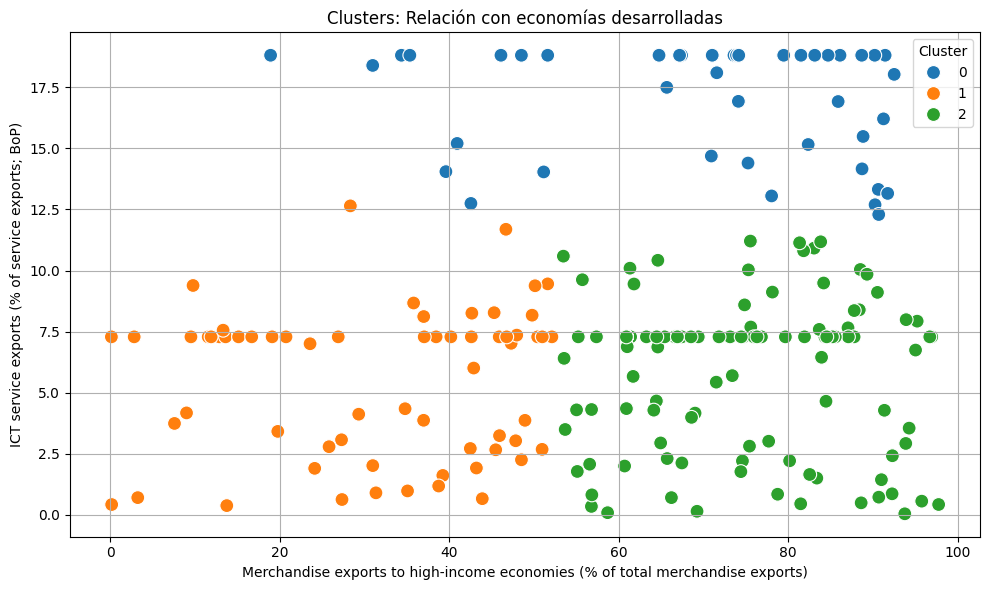


Cluster 0:
['Angola', 'Argentina', 'Armenia', 'Austria', 'Belgium']

Cluster 1:
['Afghanistan', 'Aruba', 'Australia', 'Bahamas', 'Benin']

Cluster 2:
['Albania', 'Algeria', 'American Samoa', 'Andorra', 'Antigua and Barbuda']


In [98]:
# escala
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[comb])

# training
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(X_scaled)

# clusters en 2D
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df[comb[0]],
    y=df[comb[1]],
    hue=df['cluster'],
    palette='tab10',
    s=100
)
plt.title('Clusters: Relación con economías desarrolladas')
plt.xlabel(comb[0])
plt.ylabel(comb[1])
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

# muestra de países por cluster
for i in range(3):
    print(f"\nCluster {i}:")
    muestra = df[df['cluster'] == i].index.tolist()[:5]
    print(muestra)


---

**Cluster 0:** Alta dependencia tecnológica y comercial. Países en este grupo presentan altos niveles tanto en exportaciones hacia economías desarrolladas como en exportaciones de servicios TIC. Se caracterizan por estar altamente integrados en cadenas de valor globales, particularmente en sectores intensivos en conocimiento.
Riesgo frente a guerra comercial: Muy alto, dada su dependencia en mercados desarrollados y sectores vulnerables a medidas de control tecnológico.

**Cluster 1:** Baja integración internacional. Este grupo está conformado por países con baja participación tanto en comercio con economías desarrolladas como en servicios tecnológicos. Reflejan economías poco integradas al sistema global o con estructuras exportadoras muy básicas.
Riesgo frente a guerra comercial: Bajo en términos directos, aunque pueden ser afectados por impactos indirectos (por ejemplo, menor crecimiento global o reducción de flujos financieros internacionales).

**Cluster 2:** Alta dependencia comercial, baja participación tecnológica. Los países de este grupo exportan mayoritariamente a economías desarrolladas, pero su estructura de servicios sigue centrada en sectores tradicionales.
Riesgo frente a guerra comercial: Alto, principalmente en términos de aranceles o barreras a bienes físicos, especialmente si forman parte de cadenas productivas transnacionales.


---

## PCA

_PCA_ es una técnica de reducción de dimensionalidad que nos permite trabajar sobre un set de componentes principales ortogonales (mayor facilidad para los modelos a la hora de detectar patrones), además de permitirnos visualizar espacios multidimensionales, quedándonos sobre el espacio de PCA.



### Pregunta 2.10

Utilizando todas las variables originales y $k$ óptimo escogido en la pregunta anterior, estime un PCA con 2 componentes principales. Luego, estime un modelo _K-Means_ sobre los componentes principales obtenidos. Grafique las observaciones en un _scatterplot_ de 2 dimensiones. Coloree los puntos usando los label de los clusters obtenidos.

¿Cuáles son las principales diferencias entre los grupos? Encuentre las variables más definitivas a la hora de agrupar países con los 2 primeros componentes principales.


In [102]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
df_pca = pca.fit_transform(df)
var_exp = pca.explained_variance_ratio_
print(var_exp)
print('El total de la varianza explicada por PCA: ',round(sum(var_exp),4)*100,'%')

[0.40001642 0.2045122 ]
El total de la varianza explicada por PCA:  60.45 %


In [103]:
model = KMeans(n_clusters=3)
#Entrenamos
model.fit(df_pca)

KMeans(n_clusters=3)

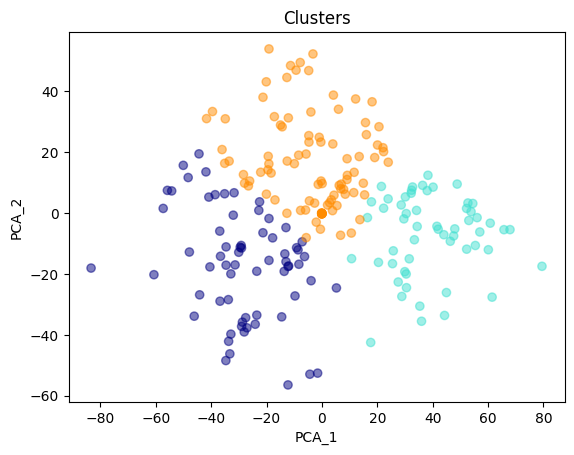

In [104]:
color = np.where(model.labels_ == 0, 'navy', np.where(model.labels_ ==1 ,'turquoise','darkorange'))

plt.scatter(df_pca[:,0],df_pca[:,1],alpha=0.5,color=color)
plt.title('Clusters')
plt.xlabel('PCA_1')
plt.ylabel('PCA_2')
plt.show()

---

Cluster 1 (izquierda): Se agrupan países con bajo desempeño exportador o baja integración tecnológica y comercial. Su posición negativa en PCA_1 sugiere debilidad en varias dimensiones clave.

Cluster 2 (centro): Representa países con un perfil intermedio, posiblemente con alguna especialización o transición estructural en sus exportaciones.

Cluster 3 (derecha): Reúne a países con alta orientación exportadora, especialmente hacia economías desarrolladas, o con una estructura de exportaciones más compleja, incluyendo servicios TIC.

Los tres grupos de países se diferencian principalmente en (variables + definitivas):
- Grado de apertura comercial y dependencia de economías desarrolladas
- Participación de servicios tecnológicos (TIC) dentro de su estructura exportadora.
- Naturaleza de los bienes exportados: manufacturas, materias primas o servicios.

---

### Pregunta 2.11


Repita lo anterior  (descripción incluida), pero con 3 componentes principales y un _scatterplot_ en 3 dimensiones.

In [106]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
df_pca = pca.fit_transform(df)
var_exp = pca.explained_variance_ratio_
print(var_exp)
print('El total de la varianza explicada por PCA: ',round(sum(var_exp),4)*100,'%')

[0.40001642 0.2045122  0.14902764]
El total de la varianza explicada por PCA:  75.36 %


In [107]:
model = KMeans(n_clusters=3)
#Entrenamos
model.fit(df_pca)

KMeans(n_clusters=3)

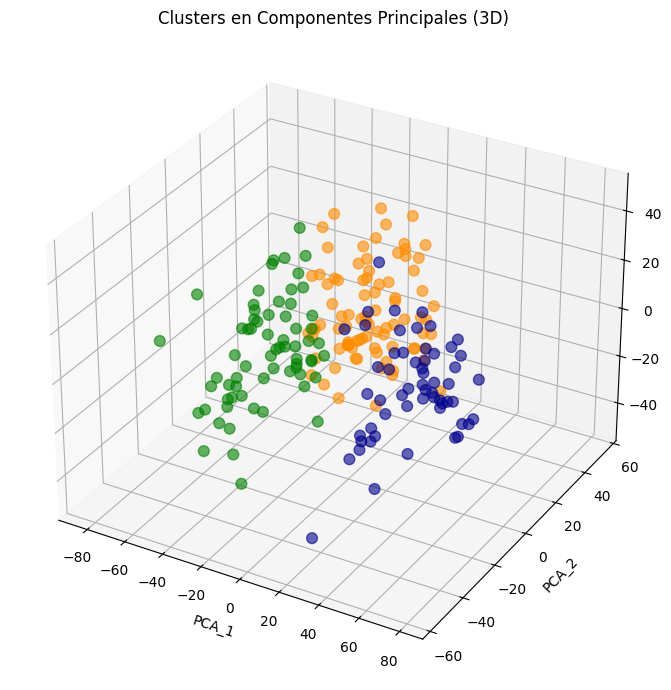

In [108]:
color = np.where(model.labels_ == 0, 'darkblue',
         np.where(model.labels_ == 1, 'darkorange', 'green'))

# Gráfico en 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=color, alpha=0.6, s=60)
ax.set_title('Clusters en Componentes Principales (3D)')
ax.set_xlabel('PCA_1')
ax.set_ylabel('PCA_2')
ax.set_zlabel('PCA_3')

plt.tight_layout()
plt.show()

---


*Escriba* su respuesta en esta celda...


---

### Pregunta 2.12

Otro de los usos de los más comúnes de _PCA_, además de _feature engineering_, es la visualización. En esta sección utilizaremos _PCA_ para confirmar visualmente que estamos clusterizando países similares.

Usando el diccionario en la celda de abajo agrega una columna de continente al _dataframe_ de trabajo.

In [35]:
country_continent_mapping = {
    'Albania': 'Europe',
    'Argentina': 'South America',
    'Armenia': 'Asia',
    'Aruba': 'North America', # Usually classified with the Caribbean
    'Australia': 'Oceania',
    'Austria': 'Europe',
    'Azerbaijan': 'Asia',
    'Bahrain': 'Asia',
    'Belgium': 'Europe',
    'Belize': 'North America',
    'Bolivia': 'South America',
    'Bosnia and Herzegovina': 'Europe',
    'Botswana': 'Africa',
    'Brazil': 'South America',
    'Brunei Darussalam': 'Asia',
    'Bulgaria': 'Europe',
    'Burkina Faso': 'Africa',
    'Cabo Verde': 'Africa',
    'Canada': 'North America',
    'Chile': 'South America',
    'China': 'Asia',
    'Colombia': 'South America',
    'Congo Dem. Rep.': 'Africa',
    'Costa Rica': 'North America',
    'Croatia': 'Europe',
    'Cyprus': 'Asia',
    'Czechia': 'Europe',
    'Denmark': 'Europe',
    'Dominican Republic': 'North America',
    'Ecuador': 'South America',
    'Egypt': 'Africa', # Transcontinental, but usually Africa
    'El Salvador': 'North America',
    'Estonia': 'Europe',
    'Ethiopia': 'Africa',
    'Finland': 'Europe',
    'France': 'Europe',
    'Gambia': 'Africa',
    'Georgia': 'Asia',
    'Germany': 'Europe',
    'Ghana': 'Africa',
    'Greece': 'Europe',
    'Guatemala': 'North America',
    'Honduras': 'North America',
    'Hong Kong': 'Asia',
    'Hungary': 'Europe',
    'Iceland': 'Europe',
    'India': 'Asia',
    'Indonesia': 'Asia',
    'Ireland': 'Europe',
    'Italy': 'Europe',
    'Japan': 'Asia',
    'Jordan': 'Asia',
    'Kazakhstan': 'Asia', # Transcontinental, mostly Asia
    'Kenya': 'Africa',
    'Korea Rep.': 'Asia',
    'Latvia': 'Europe',
    'Lesotho': 'Africa',
    'Lithuania': 'Europe',
    'Luxembourg': 'Europe',
    'Macao': 'Asia',
    'Malaysia': 'Asia',
    'Malta': 'Europe',
    'Mauritania': 'Africa',
    'Mauritius': 'Africa',
    'Mexico': 'North America',
    'Moldova': 'Europe',
    'Montenegro': 'Europe',
    'Morocco': 'Africa',
    'Mozambique': 'Africa',
    'Namibia': 'Africa',
    'Netherlands': 'Europe',
    'New Zealand': 'Oceania',
    'Nicaragua': 'North America',
    'Niger': 'Africa',
    'North Macedonia': 'Europe',
    'Norway': 'Europe',
    'Pakistan': 'Asia',
    'Panama': 'North America',
    'Paraguay': 'South America',
    'Peru': 'South America',
    'Philippines': 'Asia',
    'Poland': 'Europe',
    'Portugal': 'Europe',
    'Romania': 'Europe',
    'Samoa': 'Oceania',
    'Saudi Arabia': 'Asia',
    'Senegal': 'Africa',
    'Singapore': 'Asia',
    'Slovak Republic': 'Europe',
    'Slovenia': 'Europe',
    'South Africa': 'Africa',
    'Spain': 'Europe',
    'Sri Lanka': 'Asia',
    'Sweden': 'Europe',
    'Switzerland': 'Europe',
    'Tanzania': 'Africa',
    'Thailand': 'Asia',
    'Timor-Leste': 'Asia',
    'Tunisia': 'Africa',
    'Turkiye': 'Asia', # Transcontinental, mostly Asia
    'Uganda': 'Africa',
    'Ukraine': 'Europe',
    'United Kingdom': 'Europe',
    'United States': 'North America',
    'Uruguay': 'South America',
    'Uzbekistan': 'Asia',
    'Zambia': 'Africa'
}


### Pregunta 2.13

Realice un PCA de 2 componentes principales, grafique un _scatterplot_ del resultado y coloree cada punto según su continente. ¿Que se obserba?


---


*Escriba* su respuesta en esta celda...


---

### Pregunta 2.14

Genera el mismo gráfico anterior, pero ahora coloree los puntos del scatterplot usando los clusters de un KMeans de 3 clústers y `random_state=42`. Describa los clusters según el gráfico.



---


*Escriba* su respuesta en esta celda...


---

### Pregunta 2.15

¿Cual es la proporcion de cada cluster por continente?


### Pregunta 2.16

¿Cuál es la característica numérica más alta en magnitud por cluster (usando sus centroides)? ¿Cuál es su signo? ¿Como nos ayuda a interpretar los clusters? ¿Que podemos concluir de cada uno de estos clusters en contexto de la guerra comercial?


---


*Escriba* su respuesta en esta celda...


---